In [1]:
import json
import torch
import pandas as pd
import os.path as osp
import numpy as np
import itertools
from PIL import Image
import pickle
import matplotlib.pyplot as plt

from artemis.in_out.basics import unpickle_data

%load_ext autoreload
%autoreload 2

In [2]:
ARTEMIS_EMOTIONS = ['amusement', 'awe', 'contentment', 'excitement',
                    'anger', 'disgust',  'fear', 'sadness', 'something else']
EMOTION_TO_IDX = {e: i for i, e in enumerate(ARTEMIS_EMOTIONS)}

In [ ]:
## USE YOUR PATHS in cell below.

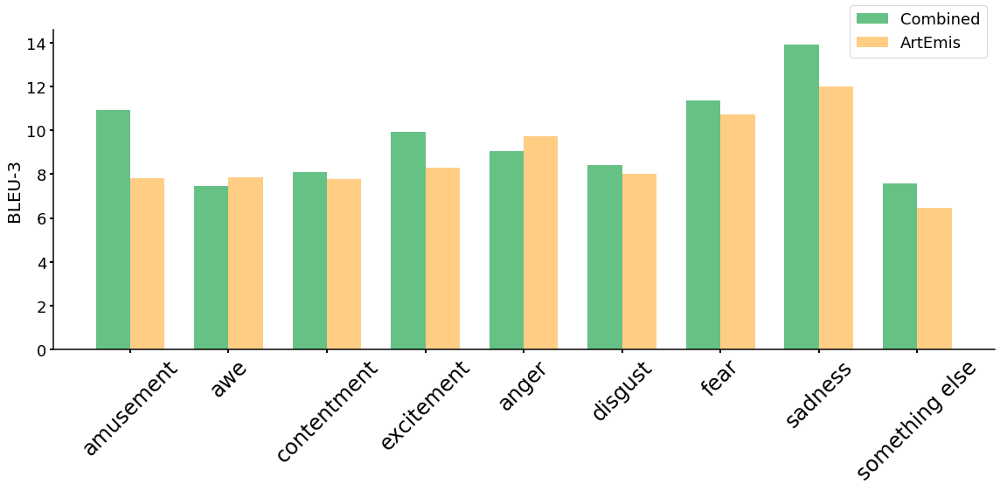

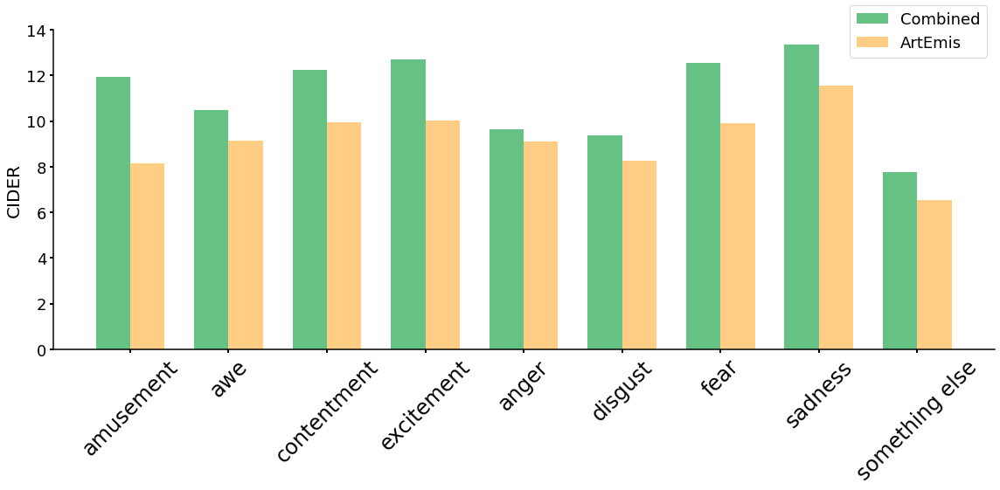

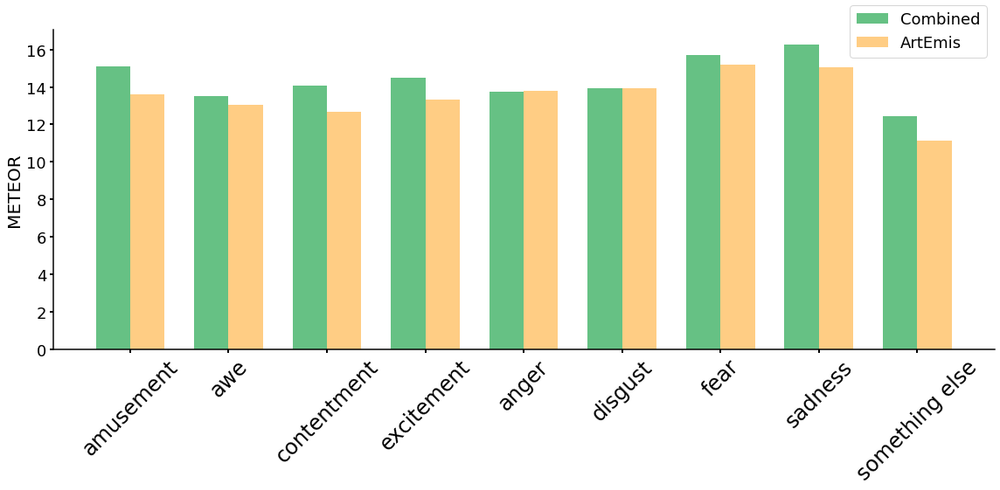

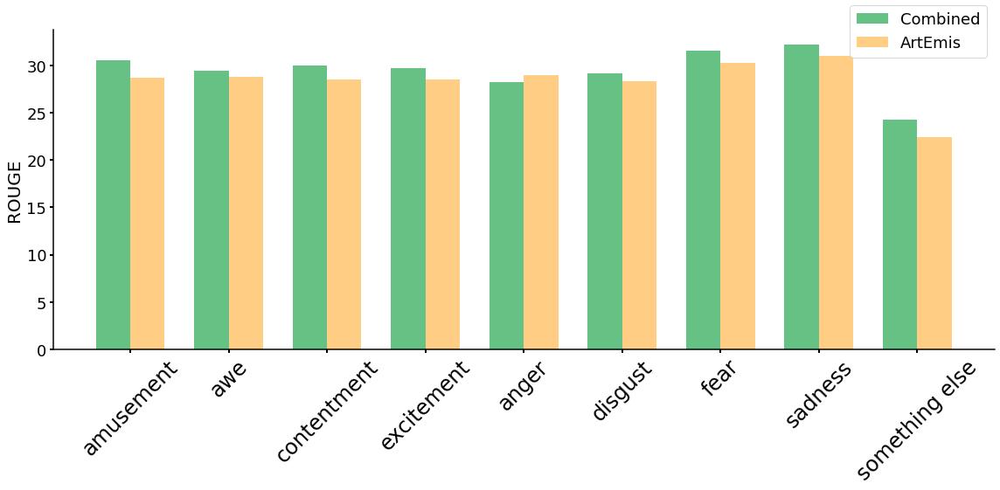

In [507]:
base_path = '/home/mohameys/artemis/artemis/emotion_break/'
# target_metrics = ['BLEU-0', 'BLEU-1', 'BLEU-2', 'BLEU-3', 'CIDER', 'METEOR', 'ROUGE']
target_metrics = ['BLEU-3', 'CIDER', 'METEOR', 'ROUGE']
x = np.arange(len(ARTEMIS_EMOTIONS))  # the label locations
width = 0.35  # the width of the bars
train_sets = ['combined_emo', 'old_large_emo']
easy_names = ['Combined', 'ArtEmis']
colors = ['#009933', '#ffad33'] 
test_sets = ['40']
gran = 'coarse'
for target_metric in target_metrics:
    for test_set in test_sets:
        fig, ax = plt.subplots(figsize=(16,8))
        for i, train_set in enumerate(train_sets):
            with open(base_path+train_set+'_'+test_set+'_'+gran+'.pkl', 'rb') as f:
                metrics = pickle.load(f)
            scores = np.zeros(len(ARTEMIS_EMOTIONS))
            for e, df in metrics.items():
                scores[EMOTION_TO_IDX[e]] = df[df['metric']==target_metric]['mean'].iloc[0] * 100
            rects = ax.bar(x - width*len(train_sets)/2 + (i+0.5)*width , scores, width, label=easy_names[i],
                           color=colors[i], alpha=0.6)
        ax.set_ylabel(target_metric, fontsize=20)
        ax.set_xticks(x)
        ax.set_xticklabels(ARTEMIS_EMOTIONS, fontsize=24, rotation=45)
        ax.tick_params(axis='y', which='major', labelsize=18)
        ax.legend(fontsize=18, loc=1, bbox_to_anchor=(1,1.1))
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        [ax.spines[i].set_linewidth(1.5) for i in ax.spines.keys()]
        ax.tick_params(axis='both', which='both', width=2, length=4)
        
        fig.tight_layout()

        plt.show()

In [ ]:
def split_img_file(row):
    img_file = row['image_file']
    splitted_img_file = img_file.split('/')
    art_style = splitted_img_file[-2]
    painting = splitted_img_file[-1].split('.')[0]
    row['art_style'] = art_style
    row['painting'] = painting
    return row

In [ ]:
train_sets = ['combined_emo', 'old_large_emo', 'new_emo', 'old_small_emo', 'combined', 'old_large', 'new', 'old_small', 'vanilla']
test_sets = ['all', 'new', 'old', 'ref', '40']
train_set = train_sets[0]
test_set = test_sets[0]
# the file with the samples
sampled_captions_file = f'/home/mohameys/artemis/artemis/sampled/SAT_Artemis_{train_set}_{test_set}.pkl'
saved_samples = next(unpickle_data(sampled_captions_file))
sampling_config_details = saved_samples[0][0]
captions = saved_samples[0][1].apply(split_img_file, axis=1) if 'csv' in references_file else captions
attn = saved_samples[0][2]

new


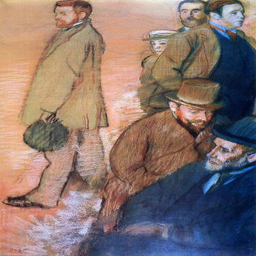

0 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Impressionism/edgar-degas_six-friends-of-the-artist-1885.jpg the man in the painting looks like he is about to the other man


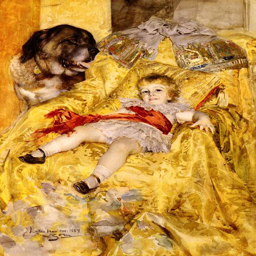

1 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Impressionism/anders-zorn_a-portrait-of-a-christian-de-falbe.jpg the two women look like they are enjoying each other


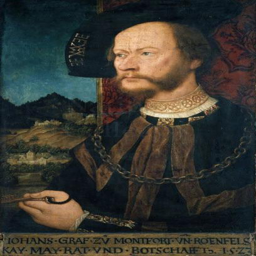

2 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Northern_Renaissance/bernhard-strigel_portrait-of-count-johann-ii-count-of-montfort-and-rothenfels.jpg the man looks very serious and sad


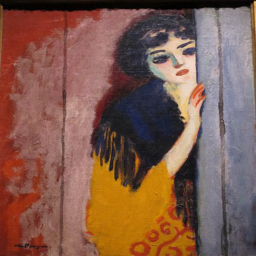

3 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Expressionism/kees-van-dongen_la-gitane-la-curieuse-1911.jpg the woman looks like she is about to cry


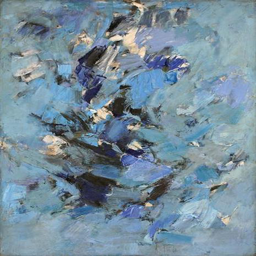

4 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the dark colors look gloomy and the colors are dark and gloomy


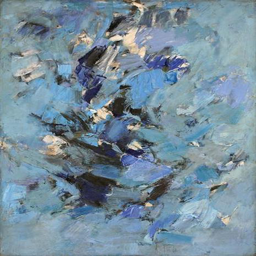

5 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the dark colors look like they are in the water


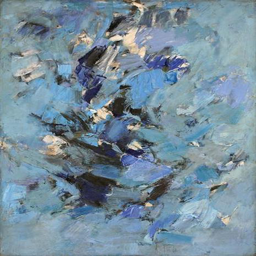

6 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the dark colors look like they are in the water


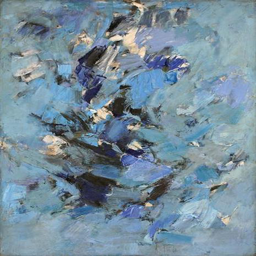

7 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the sea looks like a storm is coming


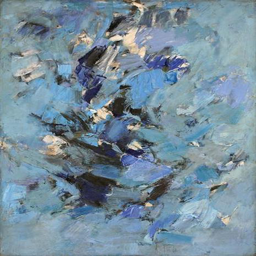

8 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the waves look like they are in the sea


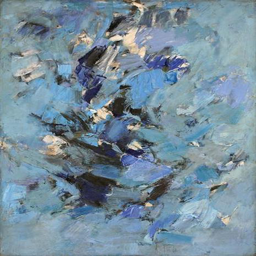

9 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the waves look like they are in the sea


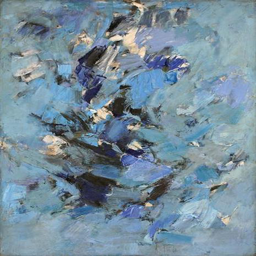

10 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the sea looks like a storm is coming


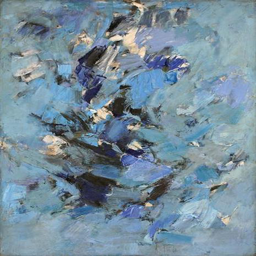

11 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/adnan-coker_unknown-title(10).jpg the waves look like they are in the sea


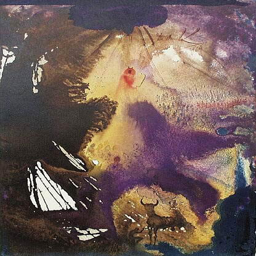

12 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the dark colors and the painting makes it feel sad


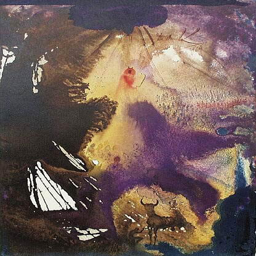

13 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the painting looks like it is about to the original


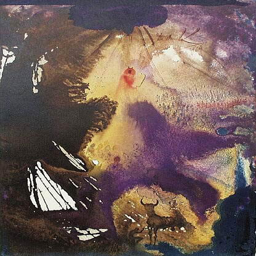

14 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the painting is disgusting


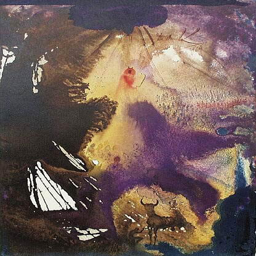

15 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the dark colors and the sky looks like blood


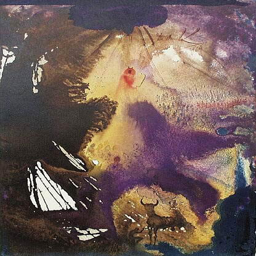

16 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the painting is very beautiful


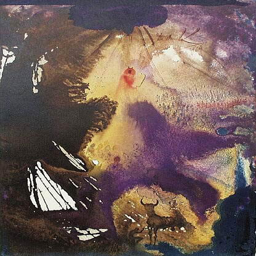

17 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the colors of the painting makes it look like a nice day


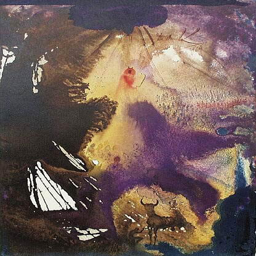

18 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the colors of the painting makes me feel awe


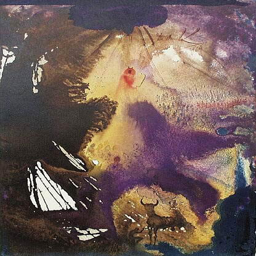

19 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/salvador-dali_ego-sum-dominus-deus-tuus-exodus-34-28-1967.jpg the red and the colors of the painting makes me feel awe


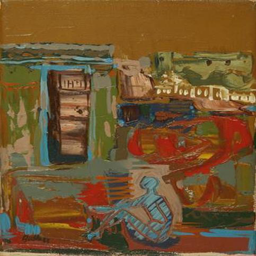

20 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the painting is very dark and the colors are very dull and depressing


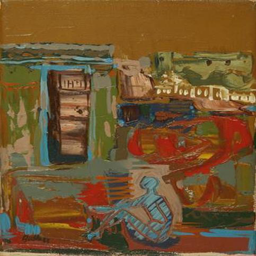

21 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the colors are very dark and the red looks like blood


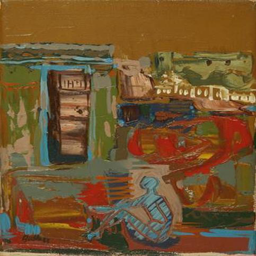

22 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the painting is very dark and the overall looks like a dirty place


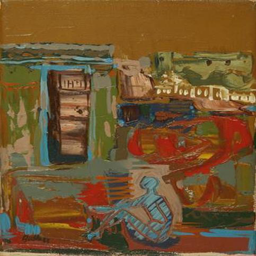

23 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the colors are very dark and the red looks like blood


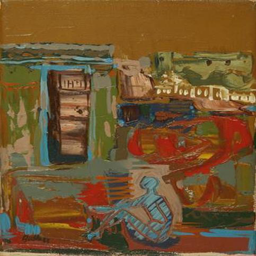

24 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the painting is very beautiful and the colors are very calming


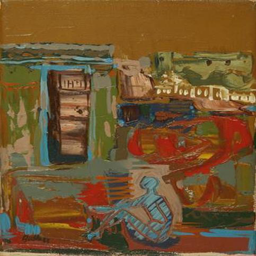

25 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the colors are very bright and the red looks like a dirty day


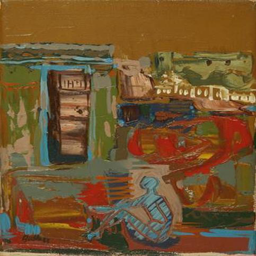

26 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the colors are very dark and the red looks like blood


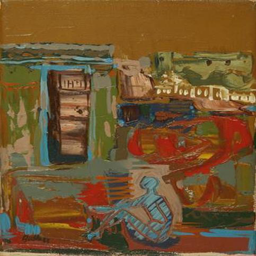

27 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Abstract_Expressionism/walter-battiss_blue-figure.jpg the colors are very bright and the red looks like blood


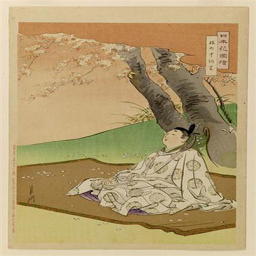

28 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is in the middle of the window


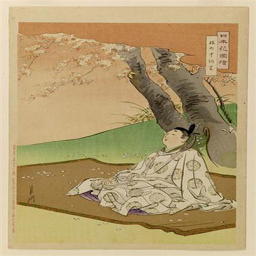

29 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is in the middle of the way


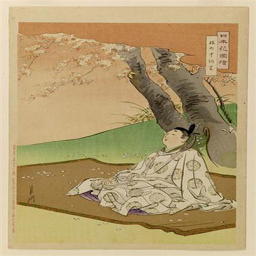

30 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is in the middle of the way


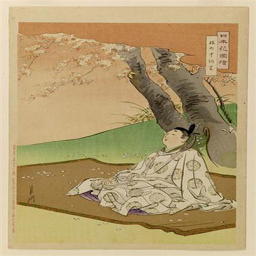

31 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is about to the window


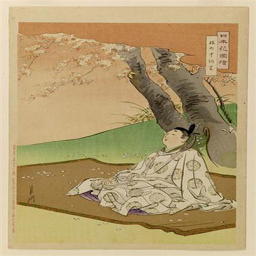

32 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman is sitting in the painting looks like she is about to walk


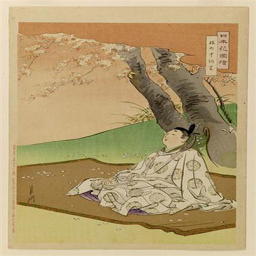

33 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the person in the painting looks like she is about to the window


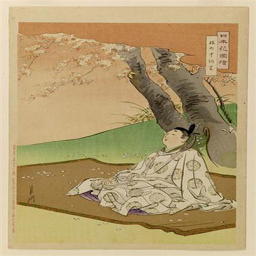

34 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is about to the window


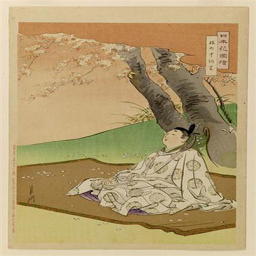

35 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Ukiyo_e/ogata-gekko_nihon-hana-zue-1897-2.jpg the woman looks like she is in the middle of the way


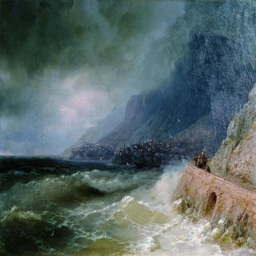

36 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like it is about to the boat


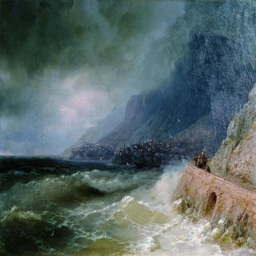

37 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming to the shore


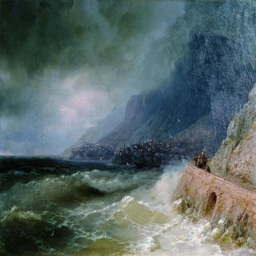

38 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming


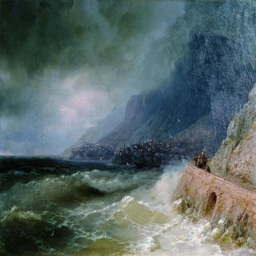

39 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming


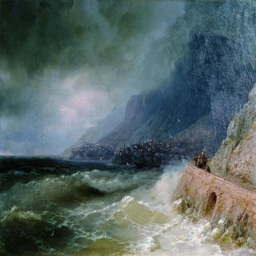

40 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a nice sea


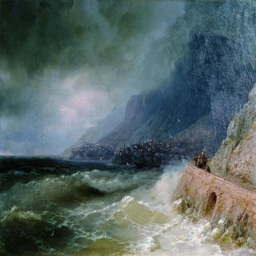

41 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming to the shore


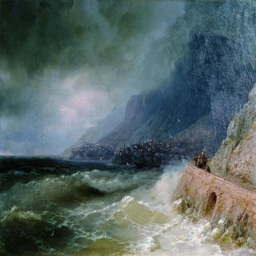

42 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming


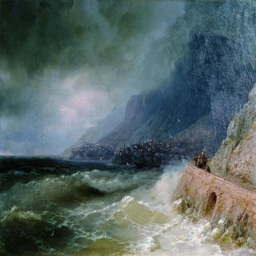

43 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Romanticism/ivan-aivazovsky_surf-near-coast-of-crimea-1880.jpg the waves in the painting looks like a storm is coming


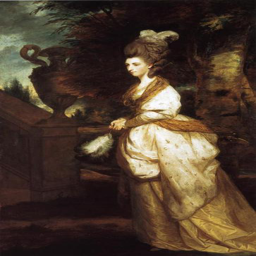

44 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very sad and she looks like she is about to cry


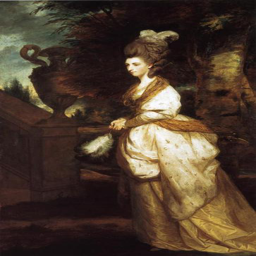

45 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very happy and she is looking at her


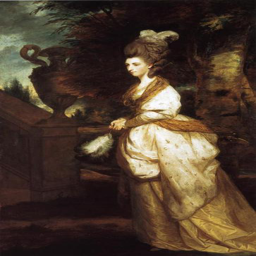

46 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman is looking at the painting


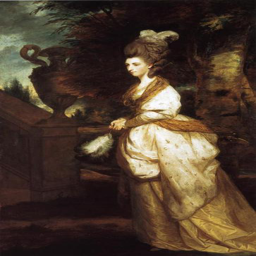

47 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very serious and the dark colors are dark and gloomy


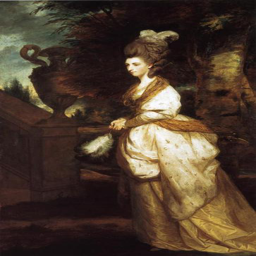

48 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very content and happy


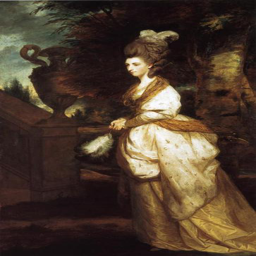

49 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very happy and she looks like she is having a good time


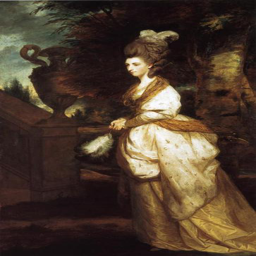

50 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very happy and she looks like she is about to her


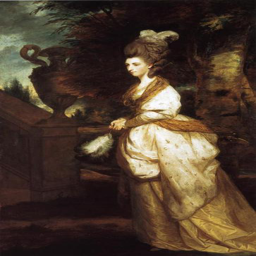

51 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_isabella-lady-beauchamp-1778.jpg the woman looks very happy and she is looking at her


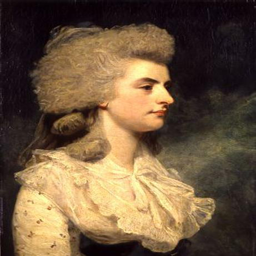

52 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to cry


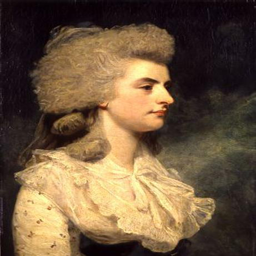

53 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to cry


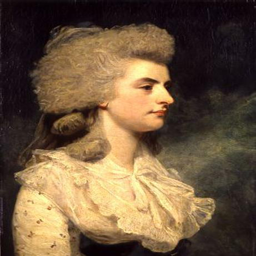

54 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to cry


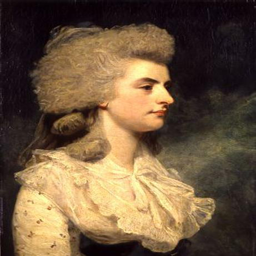

55 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to cry


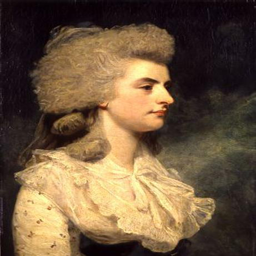

56 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman in the painting looks happy and content


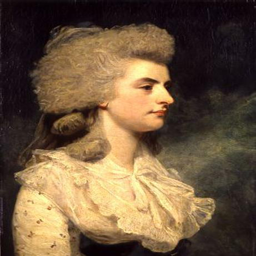

57 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman 's face is very happy and she looks happy


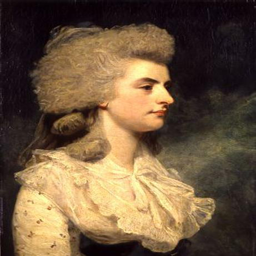

58 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to cry


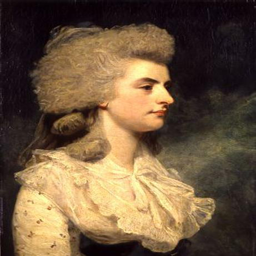

59 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Rococo/joshua-reynolds_lady-elizabeth-seymour-conway.jpg the woman looks like she is about to do something


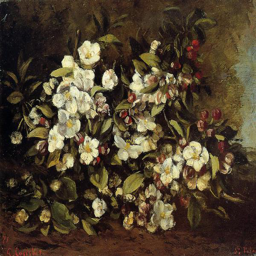

60 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are dying


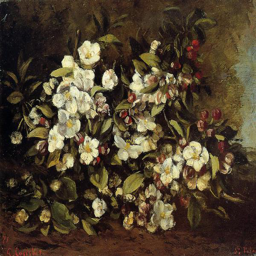

61 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and dying


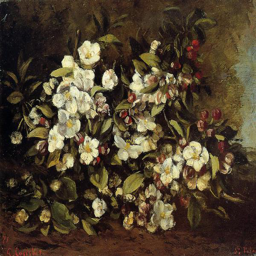

62 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and dying


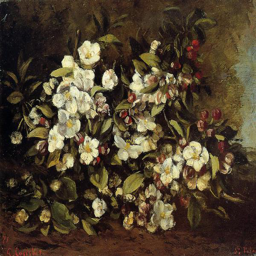

63 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and dying


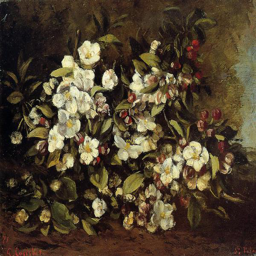

64 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and happy


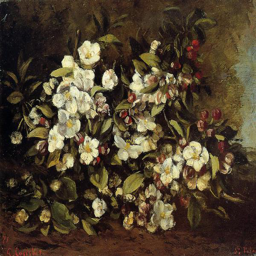

65 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and dying


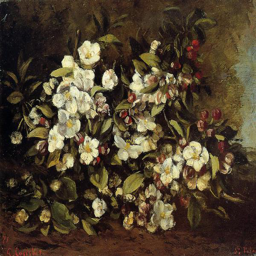

66 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting and dying


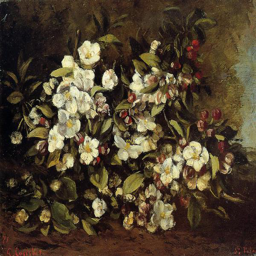

67 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Realism/gustave-courbet_branch-of-apple-blossoms-1871.jpg the flowers look like they are wilting


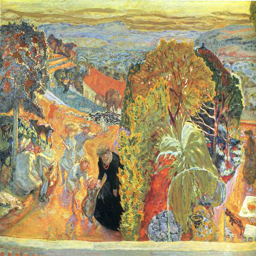

68 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a woman that is sad and the colors are very sad


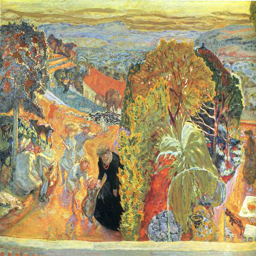

69 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the colors are very beautiful and the painting is not a sense of anger


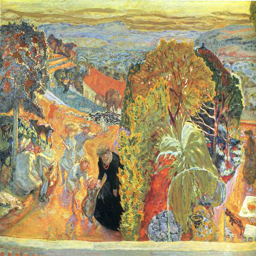

70 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a woman that is a little gross


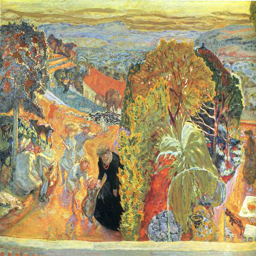

71 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the two people in the painting makes me feel fear and the colors are scary


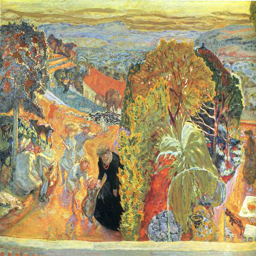

72 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a beautiful scene of the painting


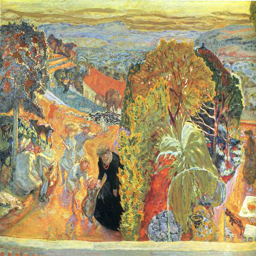

73 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a beautiful woman and the colors are very beautiful


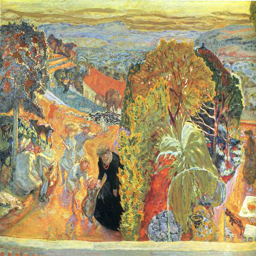

74 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a beautiful scene of the painting makes me feel awe


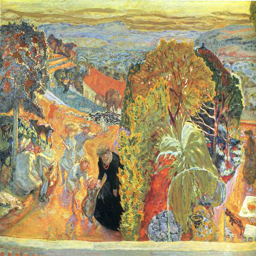

75 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_in-summer-1931.jpg the image shows a beautiful painting makes me feel awe


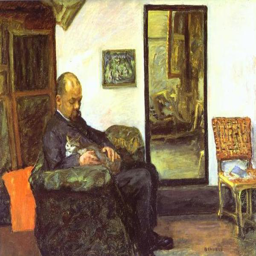

76 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman looks like she is sitting in the chair and the window on the table


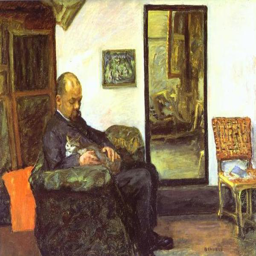

77 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman looks like she is sitting in the chair and the room is not very happy


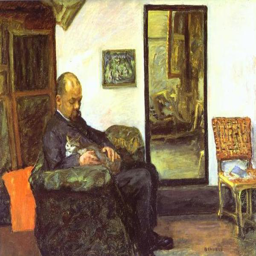

78 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the lady in the painting looks very gross and the room is not off


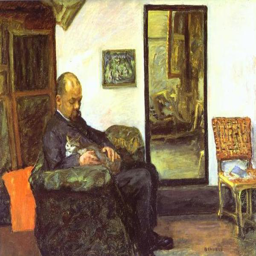

79 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman looks like she is sitting in the chair and the window on the table


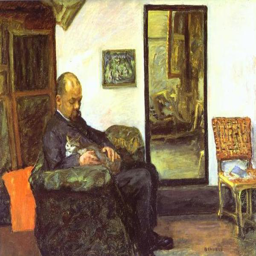

80 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman in the painting looks very content and the colors are very happy and content


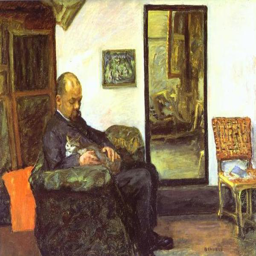

81 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman looks like she is sitting in the chair and the window is very happy


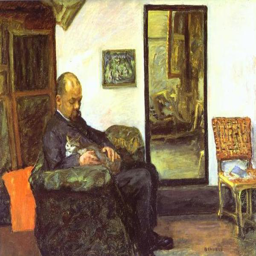

82 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman looks like she is sitting in the chair and the window is very happy


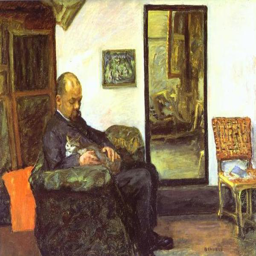

83 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/pierre-bonnard_ambroise-vollard.jpg the woman in the painting looks very relaxed and the colors are very bright and happy


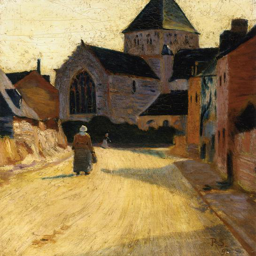

84 : sadness : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image shows a man who is not alone


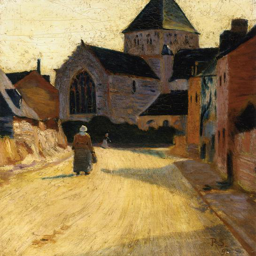

85 : anger : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image shows a man who is not not good


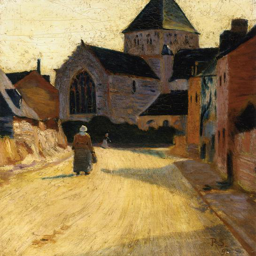

86 : disgust : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image is not really attractive


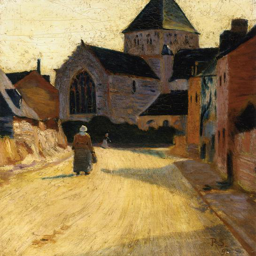

87 : fear : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image looks very dreary and the shadows are scary


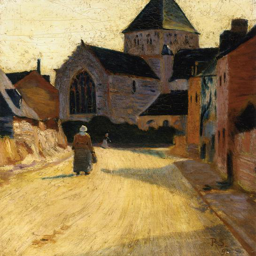

88 : contentment : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image is very beautiful and the colors are not pleasant


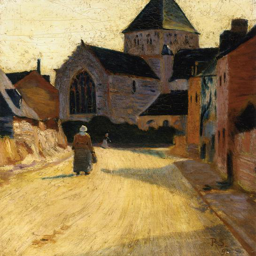

89 : amusement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image shows a very peaceful scene


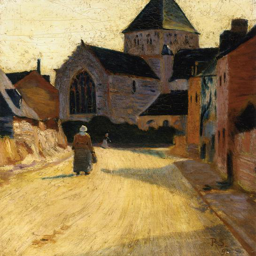

90 : excitement : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image shows a very peaceful scene


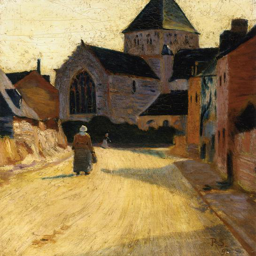

91 : awe : /ibex/scratch/mohameys/wiki_art_paintings/rescaled_600px_max_side/Post_Impressionism/paul-serusier_woman-in-a-street-1891.jpg the image shows a beautiful scene of the painting


In [90]:
## Bonus see some Images with their caption.
max_results = 1000000
for i, row in captions.iloc[:].iterrows():
    if i >= max_results:
        break
    img_file = osp.join(row['image_file'])
    display(Image.open(img_file).resize((256, 256)))
    print(i,':', row['grounding_emotion'], ':', row['image_file'], row['caption'])    